In [1]:
import sys
import datetime as dt
from copy import deepcopy
from os import getcwd
from os.path import dirname, join

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import pandas as pd
import pytz
from matplotlib import cm
from scipy.spatial import distance
from simplekml import Kml

PROJ_DIR = dirname(getcwd())
sys.path.append(PROJ_DIR)

SRC_DIR = join(PROJ_DIR, 'MAMMAL')
DATA_DIR = join(PROJ_DIR, 'data')
TEST_DIR = join(DATA_DIR, 'test')

from MAMMAL import Diurnal
from MAMMAL.Parse import parseGSMP as pgsmp
from MAMMAL.Parse import parseIM as pim
from MAMMAL.Parse import parseLCM as plcm
from MAMMAL.Utils import Filters as filt


%matplotlib inline
plt.rcParams["figure.figsize"] = (30, 15) # (w, h)


GROUND_REF_DIR = r'C:\Users\ltber\Desktop\files\AFIT\Research\WPAFB_Survey\data\ground_reference'
SURVEY_DIR     = r'C:\Users\ltber\Desktop\files\AFIT\Research\WPAFB_Survey\data\flight_data\tolles_lawson'

GMAP_FNAME = r'C:\Users\ltber\Desktop\files\AFIT\Research\WPAFB_Survey\data\wpafb.jpg'
REF_FNAME  = '2022_08_02_19_31_08_sensor_reading.txt'
LOG_FNAME  = 'project_20220803_18_03_58.00'
KML_FNAME  = 'Tolles_Lawson.kml'
CSV_FNAME  = 'project_20220803_18_03_58_converted_log.csv'

REF_SCALE  = 0.9085188140966254
REF_OFFSET = -303.379800056381

SURVEY_NAME = 'Flown Tolles Lawson'
SURVEY_FILE = '20220803_18_03_58'

START_UTC = dt.datetime(2022, 8, 3, 18, 58, 18, tzinfo=pytz.utc)
START_UTC = dt.datetime.fromtimestamp(START_UTC.timestamp())

END_UTC = dt.datetime(2022, 8, 3, 19, 7, 50, tzinfo=pytz.utc)
END_UTC = dt.datetime.fromtimestamp(END_UTC.timestamp())

LEVER_ARM = np.array([-0.8000, -0.0508, 0.0635])

INTERP_FS         = 100 # Hz
MAX_EXPECTED_FREQ = 25.0 / 121.0 # Max speed (m/s) / min alt AGL (m) = max expected magnetic frequency (hz)


def save_df_as_kml(df, kmlname, fname):
    datetimes = pd.to_datetime(df.datetime)
    datetimes = datetimes.dt.strftime('%Y-%m-%dT%H:%M:%S.%fZ')
    
    when  = list(datetimes)
    coord = list(zip(df.LONG, df.LAT, df.ALT))
    
    kml = Kml(name=kmlname, open=1)
    
    # Create the KML document
    doc = kml.newdocument(name='Calibration')
    doc.lookat.gxtimespan.begin = when[0]
    doc.lookat.gxtimespan.end   = when[-1]
    doc.lookat.longitude        = df.LONG.iloc[0]
    doc.lookat.latitude         = df.LAT.iloc[0]
    doc.lookat.range            = 1300.0
    
    # Create a folder
    fol = doc.newfolder(name='Flight Path')
    
    # Create a new track in the folder
    trk = fol.newgxtrack(name='Flight Path')
    
    # Add all the information to the track
    trk.newwhen(when)     # Each item in the give nlist will become a new <when> tag
    trk.newgxcoord(coord) # Ditto
    
    # Styling
    trk.stylemap.normalstyle.iconstyle.icon.href    = 'http://earth.google.com/images/kml-icons/track-directional/track-0.png'
    trk.stylemap.normalstyle.linestyle.color        = '99ffac59'
    trk.stylemap.normalstyle.linestyle.width        = 6
    trk.stylemap.highlightstyle.iconstyle.icon.href = 'http://earth.google.com/images/kml-icons/track-directional/track-0.png'
    trk.stylemap.highlightstyle.iconstyle.scale     = 1.2
    trk.stylemap.highlightstyle.linestyle.color     = '99ffac59'
    trk.stylemap.highlightstyle.linestyle.width     = 8
    
    kml.save(fname)

# Load Survey Data

In [2]:
pd.set_option('mode.chained_assignment', None)
    
img = mpimg.imread(GMAP_FNAME)
    
ref_df = pim.loadInterMagData(GROUND_REF_DIR)['FRD']

log_df    = plcm.convert_log(join(SURVEY_DIR, LOG_FNAME), lever_arm=LEVER_ARM)
time_mask = (log_df.epoch_sec >= START_UTC.timestamp()) & (log_df.epoch_sec <= END_UTC.timestamp())
log_df    = log_df[time_mask]
log_df    = pim.add_igrf_cols(log_df, False)

timestamps = np.array(log_df.epoch_sec)

Loaded frd20220728psec.sec
Loaded frd20220729psec.sec
Loaded frd20220730psec.sec
Loaded frd20220731psec.sec
Loaded frd20220801psec.sec
Loaded frd20220802psec.sec
Loaded frd20220803psec.sec
Parsing LCM log: C:\Users\ltber\Desktop\files\AFIT\Research\WPAFB_Survey\data\flight_data\tolles_lawson\project_20220803_18_03_58.00


100%|██████████| 1087461/1087461 [00:07<00:00, 146044.99it/s]


# Interpolate and Calibrate Reference Data

In [3]:
_, ref_mag = Diurnal.interp_reference_df(df            = ref_df,
                                         timestamps    = timestamps,
                                         survey_lon    = log_df.LONG.mean(),
                                         ref_scale     = REF_SCALE,
                                         ref_offset    = REF_OFFSET,
                                         subtract_core = True)

# Remove Core Field and Temporal Variations

In [4]:
anomaly_F = np.array(log_df.F - log_df.IGRF_F - ref_mag)

# Low Pass Filter Scalar Anomaly Values

In [5]:
lpf_anomaly_F = filt.lpf(anomaly_F, MAX_EXPECTED_FREQ, INTERP_FS)

# Save Datasets

In [6]:
save_df_as_kml(log_df, KML_FNAME, join(SURVEY_DIR, KML_FNAME))
log_df.to_csv(join(SURVEY_DIR, CSV_FNAME), index=False)

# Make Plots

(-84.108, -84.098)

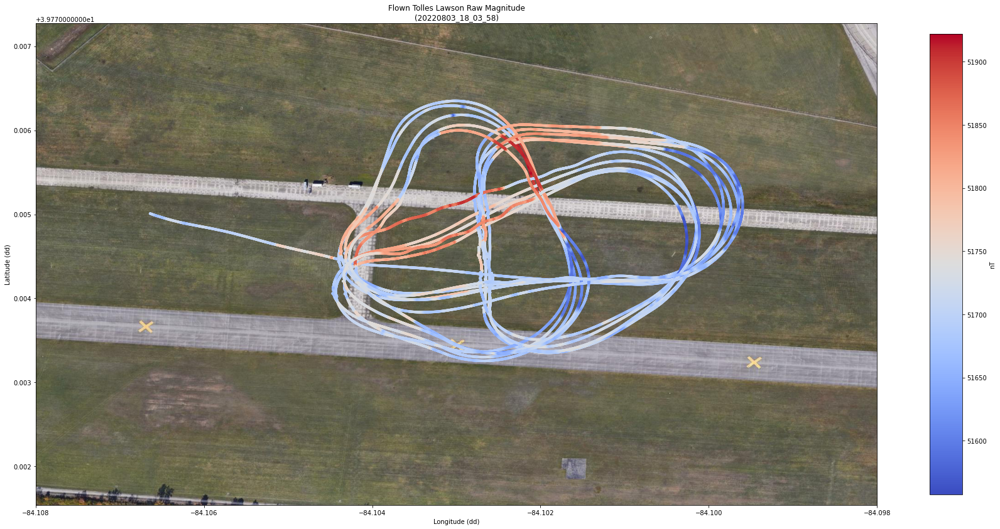

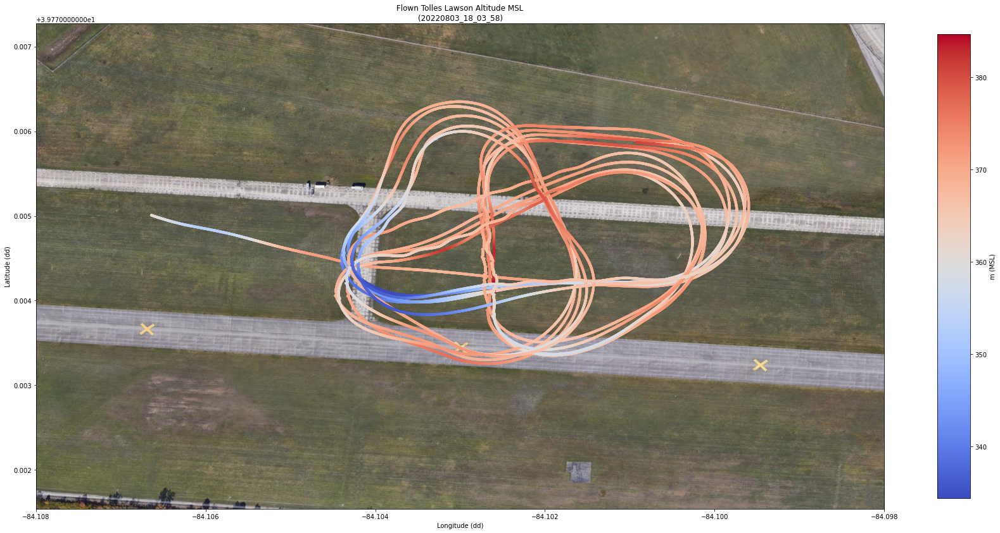

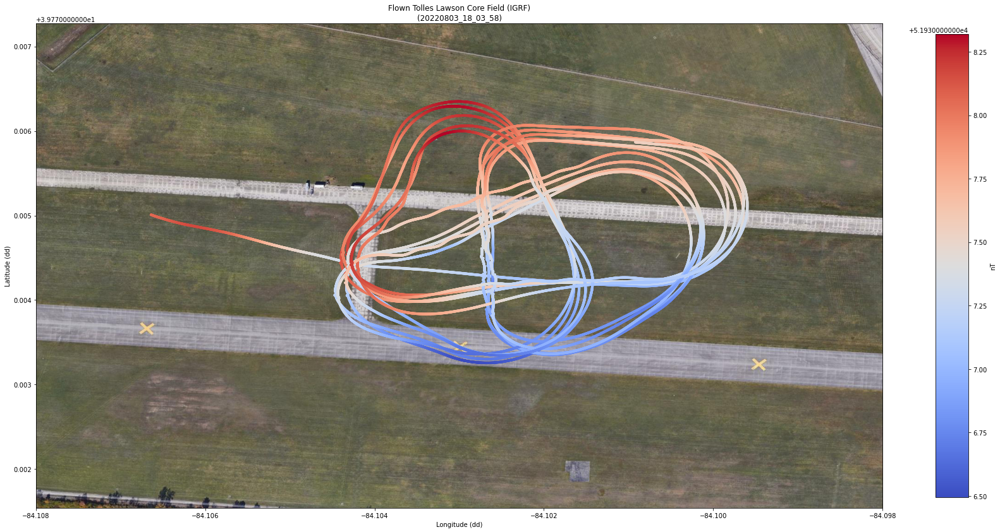

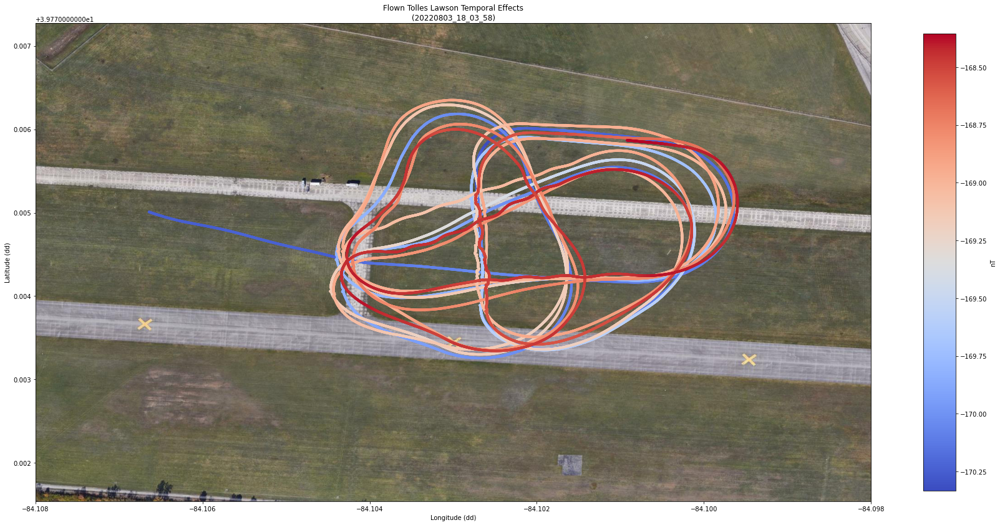

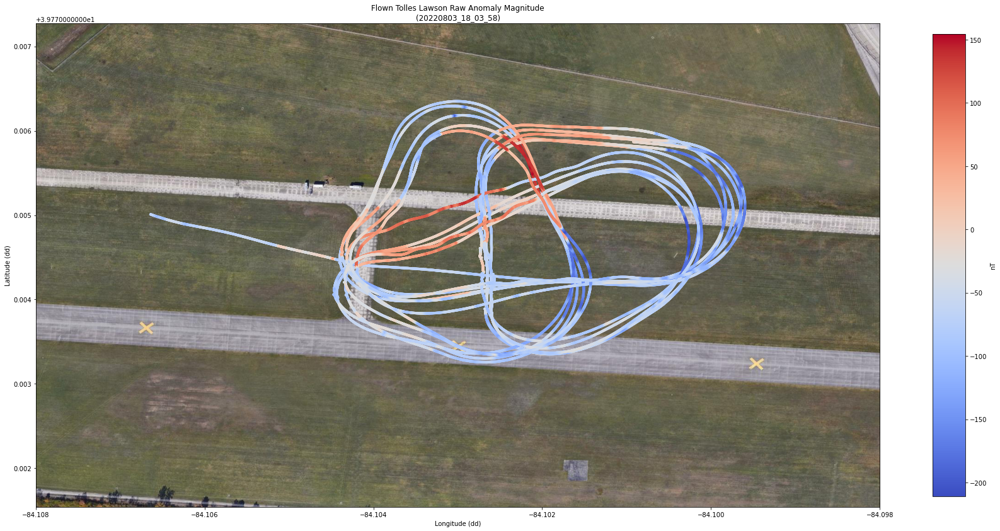

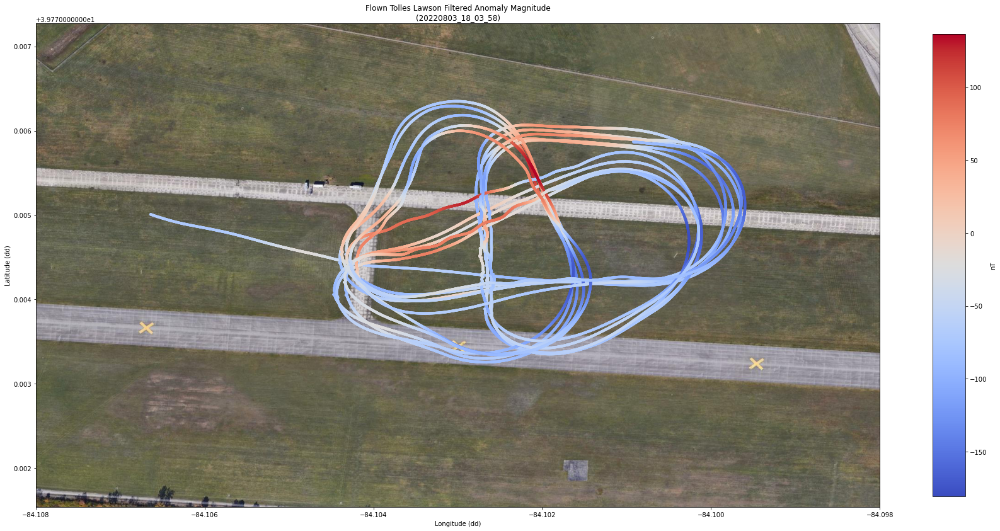

In [8]:
shrink = 0.9
aspect = 20 * 0.7
xlims  = [-84.108, -84.098]
cmap   = cm.coolwarm
s      = 10

plt.figure()
plt.title('{} Raw Magnitude\n({})'.format(SURVEY_NAME, SURVEY_FILE))
plt.xlabel('Longitude (dd)')
plt.ylabel('Latitude (dd)')
plt.imshow(img, extent=[-84.121190, -84.095010, 39.771541, 39.777271])
cb = plt.scatter(log_df.LONG, log_df.LAT, s=s, c=log_df.F, cmap=cmap)
plt.colorbar(cb, label='nT', shrink=shrink, aspect=aspect)
plt.xlim(xlims)

plt.figure()
plt.title('{} Altitude MSL\n({})'.format(SURVEY_NAME, SURVEY_FILE))
plt.xlabel('Longitude (dd)')
plt.ylabel('Latitude (dd)')
plt.imshow(img, extent=[-84.121190, -84.095010, 39.771541, 39.777271])
cb = plt.scatter(log_df.LONG, log_df.LAT, s=s, c=log_df.ALT, cmap=cmap)
plt.colorbar(cb, label='m (MSL)', shrink=shrink, aspect=aspect)
plt.xlim(xlims)

plt.figure()
plt.title('{} Core Field (IGRF)\n({})'.format(SURVEY_NAME, SURVEY_FILE))
plt.xlabel('Longitude (dd)')
plt.ylabel('Latitude (dd)')
plt.imshow(img, extent=[-84.121190, -84.095010, 39.771541, 39.777271])
cb = plt.scatter(log_df.LONG, log_df.LAT, s=s, c=log_df.IGRF_F, cmap=cmap)
plt.colorbar(cb, label='nT', shrink=shrink, aspect=aspect)
plt.xlim(xlims)

plt.figure()
plt.title('{} Temporal Effects\n({})'.format(SURVEY_NAME, SURVEY_FILE))
plt.xlabel('Longitude (dd)')
plt.ylabel('Latitude (dd)')
plt.imshow(img, extent=[-84.121190, -84.095010, 39.771541, 39.777271])
cb = plt.scatter(log_df.LONG, log_df.LAT, s=s, c=ref_mag, cmap=cmap)
plt.colorbar(cb, label='nT', shrink=shrink, aspect=aspect)
plt.xlim(xlims)

plt.figure()
plt.title('{} Raw Anomaly Magnitude\n({})'.format(SURVEY_NAME, SURVEY_FILE))
plt.xlabel('Longitude (dd)')
plt.ylabel('Latitude (dd)')
plt.imshow(img, extent=[-84.121190, -84.095010, 39.771541, 39.777271])
cb = plt.scatter(log_df.LONG, log_df.LAT, s=s, c=anomaly_F, cmap=cmap)
plt.colorbar(cb, label='nT', shrink=shrink, aspect=aspect)
plt.xlim(xlims)

plt.figure()
plt.title('{} Filtered Anomaly Magnitude\n({})'.format(SURVEY_NAME, SURVEY_FILE))
plt.xlabel('Longitude (dd)')
plt.ylabel('Latitude (dd)')
plt.imshow(img, extent=[-84.121190, -84.095010, 39.771541, 39.777271])
cb = plt.scatter(log_df.LONG, log_df.LAT, s=s, c=lpf_anomaly_F, cmap=cmap)
plt.colorbar(cb, label='nT', shrink=shrink, aspect=aspect)
plt.xlim(xlims)